## Getting Started

In [2]:
# check gpu availability
import tensorflow as tf
print(tf.__version__)
print(tf.config.list_physical_devices('GPU'))

2.13.1
[]


In [1]:
import torch 
print(torch.__version__)
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0))

2.2.2
True
NVIDIA GeForce RTX 4060 Laptop GPU


In [3]:
# BASE
# ------------------------------------------------------
import numpy as np
import pandas as pd
import os
import gc
import warnings

# PACF - ACF
# ------------------------------------------------------
import statsmodels.api as sm

# DATA VISUALIZATION
# ------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


# CONFIGURATIONS
# ------------------------------------------------------
pd.set_option('display.max_columns', None)
pd.options.display.float_format = '{:.2f}'.format
warnings.filterwarnings('ignore')
COLORS = list(sns.color_palette())

In [ ]:
# load data
train = pd.read_csv('data\\train.csv')
holidays = pd.read_csv('data\\holidays_events.csv')
stores = pd.read_csv('data\\stores.csv')
oil = pd.read_csv('data\\oil.csv')
transactions = pd.read_csv('data\\transactions.csv')
test = pd.read_csv('data\\test.csv')

In [ ]:
# set date as index
holidays['date'] = pd.to_datetime(holidays['date'])

oil['date'] = pd.to_datetime(oil['date'])

train['date'] = pd.to_datetime(train['date'])

transactions['date'] = pd.to_datetime(transactions['date'])

test['date'] = pd.to_datetime(test['date'])

## Exploratory Data Analysis

#### Data Overview

In [ ]:
# helper function to print messages
def cprint(title, *args):
    print(
        "="*len(title), title, "="*len(title),
        *args,
        sep="\n",
    )

In [ ]:
num_family = train.family.nunique()
num_store = train.store_nbr.nunique()
num_ts = train.groupby(["store_nbr", "family"]).ngroups
train_start = train.date.min().date()
train_end = train.date.max().date()
num_train_date = train.date.nunique()
train_len = (train_end - train_start).days + 1
test_start = test.date.min().date()
test_end = test.date.max().date()
num_test_date = test.date.nunique()
test_len = (test_end - test_start).days + 1

In [ ]:
cprint(
    "Basic information of data",
    f"Number of family types      : {num_family}",
    f"Number of stores            : {num_store}",
    f"Number of store-family pairs: {num_family * num_store}",
    f"Number of target series     : {num_ts}",
    "",
    f"Number of unique train dates: {num_train_date}",
    f"Train date range            : {train_len} days from {train_start} to {train_end}",
    f"Number of unique test dates : {num_test_date}",
    f"Test date range             : {test_len} days from {test_start} to {test_end}",
)

Basic information of data
Number of family types      : 33
Number of stores            : 54
Number of store-family pairs: 1782
Number of target series     : 1782

Number of unique train dates: 1684
Train date range            : 1688 days from 2013-01-01 to 2017-08-15
Number of unique test dates : 16
Test date range             : 16 days from 2017-08-16 to 2017-08-31


In [ ]:
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0
1,1,2013-01-01,1,BABY CARE,0.00,0
2,2,2013-01-01,1,BEAUTY,0.00,0
3,3,2013-01-01,1,BEVERAGES,0.00,0
4,4,2013-01-01,1,BOOKS,0.00,0


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype         
---  ------       -----         
 0   id           int64         
 1   date         datetime64[ns]
 2   store_nbr    int64         
 3   family       object        
 4   sales        float64       
 5   onpromotion  int64         
dtypes: datetime64[ns](1), float64(1), int64(3), object(1)
memory usage: 137.4+ MB


In [ ]:
# unique values in train data
train.nunique()

id             3000888
date              1684
store_nbr           54
family              33
sales           379610
onpromotion        362
dtype: int64

In [ ]:
holidays.head()

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [ ]:
holidays.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         350 non-null    datetime64[ns]
 1   type         350 non-null    object        
 2   locale       350 non-null    object        
 3   locale_name  350 non-null    object        
 4   description  350 non-null    object        
 5   transferred  350 non-null    bool          
dtypes: bool(1), datetime64[ns](1), object(4)
memory usage: 14.1+ KB


In [ ]:
# unique values in holidays data
holidays.nunique()

date           312
type             6
locale           3
locale_name     24
description    103
transferred      2
dtype: int64

In [ ]:
stores.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [ ]:
stores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   store_nbr  54 non-null     int64 
 1   city       54 non-null     object
 2   state      54 non-null     object
 3   type       54 non-null     object
 4   cluster    54 non-null     int64 
dtypes: int64(2), object(3)
memory usage: 2.2+ KB


In [ ]:
# unique values in stores data
stores.nunique()

store_nbr    54
city         22
state        16
type          5
cluster      17
dtype: int64

In [ ]:
oil.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


In [ ]:
transactions.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [ ]:
transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83488 entries, 0 to 83487
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   date          83488 non-null  datetime64[ns]
 1   store_nbr     83488 non-null  int64         
 2   transactions  83488 non-null  int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 1.9 MB


### Data Quality Assessment

#### Sales

In [ ]:
# sales by family of products
train.groupby('family')['sales'].sum().sort_values(ascending=True)

family
BOOKS                             6438.00
BABY CARE                        10051.00
HOME APPLIANCES                  41601.00
HARDWARE                        103470.00
MAGAZINES                       266359.00
SCHOOL AND OFFICE SUPPLIES      269316.00
BEAUTY                          337893.00
PET SUPPLIES                    356584.00
LAWN AND GARDEN                 548842.00
AUTOMOTIVE                      554822.00
PLAYERS AND ELECTRONICS         562608.00
LADIESWEAR                      651159.00
LINGERIE                        653114.00
CELEBRATION                     761177.00
HOME AND KITCHEN II            1520670.00
HOME AND KITCHEN I             1861491.00
GROCERY II                     1962767.00
SEAFOOD                        2015431.88
LIQUOR,WINE,BEER               7746640.00
PREPARED FOODS                 8799895.12
FROZEN FOODS                  14073887.72
EGGS                          15588296.00
HOME CARE                     16022744.00
DELI                       

In [ ]:
# create an interactive bar chart
import plotly.express as px

fig = px.bar(train.groupby('family')['sales'].sum().sort_values(ascending=True), title='Sales by Family of Products')
fig.show()

In [ ]:
px.line(
    train.set_index("date").groupby("family").resample("D").sales.sum().reset_index(), 
    x = "date",
    y= "sales", 
    color = "family",
    title = "Daily total sales of the family"
    )

In [ ]:
a = train.groupby("family").sales.mean().sort_values(ascending = False).reset_index()
px.bar(a, y = "family", x="sales", color = "family", title = "Which product family preferred more?")

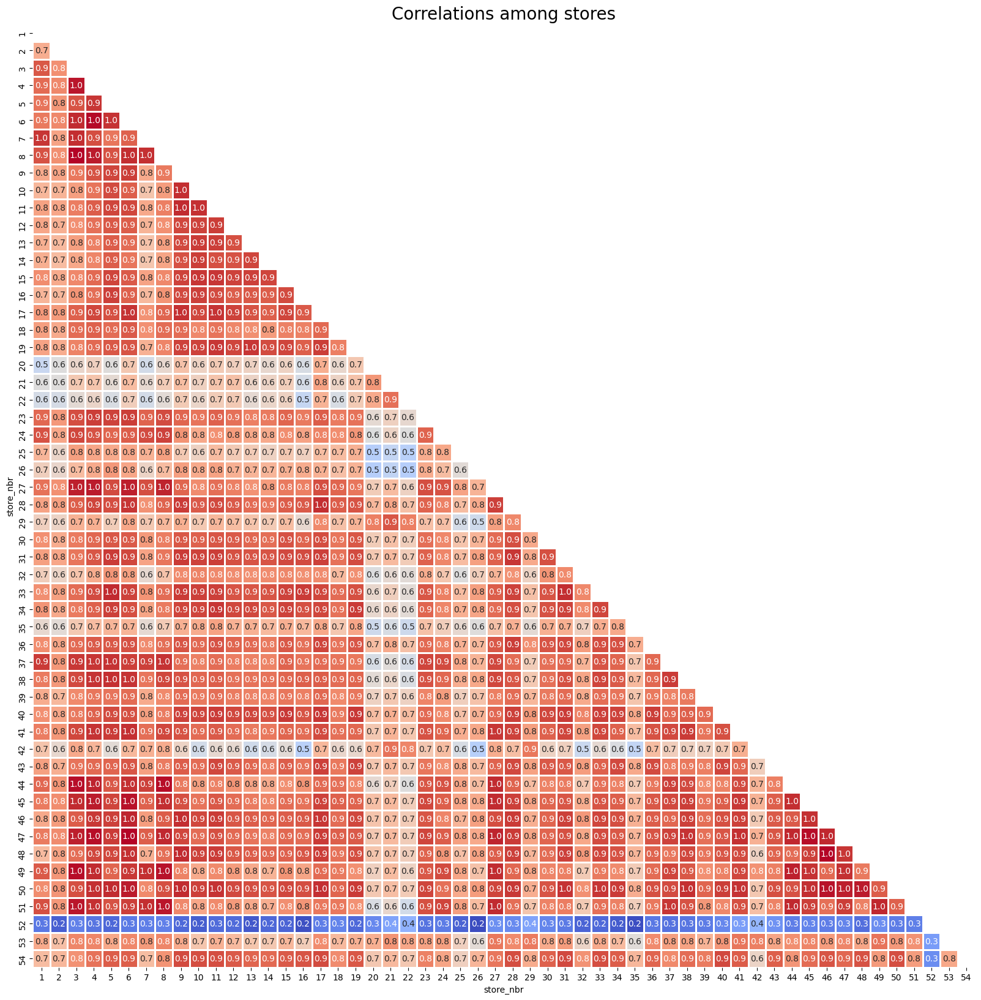

In [ ]:
# correclation matrix of sales to store_nbr
store_sales = train[["store_nbr", "sales"]].copy()

# Add a sequential index within each store group to pivot the data
store_sales['sequential_index'] = store_sales.groupby('store_nbr').cumcount() + 1

# Pivot the data to have stores as columns and each row representing a sale event
sales_pivot = store_sales.pivot_table(index="sequential_index", columns="store_nbr", values="sales")

# Calculate the correlation matrix among stores
correlation_matrix = sales_pivot.corr()

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Plotting
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix,
            annot=True,
            fmt='.1f',
            cmap='coolwarm',
            square=True,
            mask=mask,
            linewidths=1,
            cbar=False)
plt.title("Correlations among stores", fontsize=20)
plt.show()

#### Transactions

In [ ]:
# plot transactions data for each store_nbr over time
import plotly.graph_objects as go

# Create an empty figure
fig = go.Figure()

# Add a line for each store
for store in transactions['store_nbr'].unique():
    store_data = transactions[transactions['store_nbr'] == store]
    fig.add_trace(go.Scatter(x=store_data.index, y=store_data['transactions'], mode='lines', name=f'Store {store}'))

# Set the layout
fig.update_layout(title='Transactions over time per store', yaxis_title='Transactions')

# Update xaxis properties with date formatting
fig.update_xaxes(title_text='Date', tickformat="%d-%b-%Y")

# Show the figure
fig.show()

In [ ]:
import plotly.subplots as sp

# Determine the layout of the grid
num_stores = transactions['store_nbr'].nunique()
cols = 3  # number of columns in the grid
rows = num_stores // cols if num_stores % cols == 0 else num_stores // cols + 1

# Create an empty subplot
fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=[f'Store {store}' for store in transactions['store_nbr'].unique()])

# Add a line for each store
for i, store in enumerate(transactions['store_nbr'].unique(), start=1):
    store_data = transactions[transactions['store_nbr'] == store]
    fig.add_trace(go.Scatter(x=store_data.index, y=store_data['transactions'], mode='lines'), row=(i-1)//cols+1, col=(i-1)%cols+1)

# Set the layout
fig.update_layout(height=300*rows, title='Transactions over time per store', xaxis_title='Date', yaxis_title='Transactions')

# Show the figure
fig.show()

In [ ]:
transactions["year"] = transactions.date.dt.year
transactions["month"] = transactions.date.dt.month
px.box(transactions, x="year", y="transactions" , color = "month", title = "Transactions")

In [ ]:
a = transactions.set_index("date").resample("ME").transactions.mean().reset_index()
a["year"] = a.date.dt.year
px.line(a, x='date', y='transactions', color='year',title = "Monthly Average Transactions" )

In [ ]:
transactions["year"] = transactions.date.dt.year
transactions["dayofweek"] = transactions.date.dt.dayofweek+1
px.line(transactions.groupby(["year", "dayofweek"]).transactions.mean().reset_index()
, x="dayofweek", y="transactions" , color = "year", title = "Transactions")

#### Holidays

In [ ]:
# list the unique values in the type column
holidays['type'].unique()

array(['Holiday', 'Transfer', 'Additional', 'Bridge', 'Work Day', 'Event'],
      dtype=object)

In [ ]:
# list the unique values in the locale column
holidays['locale'].unique()

array(['Local', 'Regional', 'National'], dtype=object)

## Data Cleaning

In [ ]:
# ordinal encode the family column based on the sales
family_sales = train.groupby('family')['sales'].sum().sort_values(ascending=True).index
family_sales_mapping = {family: i for i, family in enumerate(family_sales, 1)}
train['family'] = train['family'].map(family_sales_mapping)

In [ ]:
train.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,10,0.00,0
1,1,2013-01-01,1,2,0.00,0
2,2,2013-01-01,1,7,0.00,0
3,3,2013-01-01,1,32,0.00,0
4,4,2013-01-01,1,1,0.00,0


### Missing Values

#### Train

In [ ]:
missing_dates = pd.date_range(train_start, train_end).difference(train.date.unique()) # list of missing dates
missing_dates = missing_dates.strftime("%Y-%m-%d").tolist() # convert to string 

unique_dp_count = train.groupby(["store_nbr", "family"]).date.count().unique().tolist() # list of unique data points

In [ ]:
cprint(
    "Missing gaps in time series",
    f"List incl. unique counts of data points: {unique_dp_count}",
    f"Missing dates                          : {missing_dates}",
)

Missing gaps in time series
List incl. unique counts of data points: [1684]
Missing dates                          : ['2013-12-25', '2014-12-25', '2015-12-25', '2016-12-25']


In [ ]:
# reindex training data
multi_idx = pd.MultiIndex.from_product(
    [pd.date_range(train_start, train_end), train.store_nbr.unique(), train.family.unique()],
    names=["date", "store_nbr", "family"],
)
train = train.set_index(["date", "store_nbr", "family"]).reindex(multi_idx).reset_index()

# fill missing values with 0s
train[["sales", "onpromotion"]] = train[["sales", "onpromotion"]].fillna(0.)
train.id = train.id.interpolate(method="linear") # interpolate linearly as a filler for the 'id'

In [ ]:
train.head()

,date,store_nbr,family,id,sales,onpromotion
0,2013-01-01,1,10,0.00,0.00,0.00
1,2013-01-01,1,2,1.00,0.00,0.00
2,2013-01-01,1,7,2.00,0.00,0.00
3,2013-01-01,1,32,3.00,0.00,0.00
4,2013-01-01,1,1,4.00,0.00,0.00


#### Oil

In [ ]:
oil.isnull().sum()

date           0
dcoilwtico    43
dtype: int64

In [ ]:
# list the records for missing values in oil data
oil[oil['dcoilwtico'].isnull()]

,date,dcoilwtico
0,2013-01-01,NaN
14,2013-01-21,NaN
34,2013-02-18,NaN
63,2013-03-29,NaN
104,2013-05-27,NaN
132,2013-07-04,NaN
174,2013-09-02,NaN
237,2013-11-28,NaN
256,2013-12-25,NaN
261,2014-01-01,NaN


In [ ]:
# see if there were holidays on the days when oil price was missing
holidays[holidays['date'].isin(oil[oil['dcoilwtico'].isnull()]['date'])]

,date,type,locale,locale_name,description,transferred
41,2013-01-01,Holiday,National,Ecuador,Primer dia del ano,False
89,2013-12-25,Holiday,National,Ecuador,Navidad,False
92,2014-01-01,Holiday,National,Ecuador,Primer dia del ano,False
99,2014-04-18,Holiday,National,Ecuador,Viernes Santo,False
120,2014-07-04,Event,National,Ecuador,Mundial de futbol Brasil: Cuartos de Final,False
155,2014-12-25,Holiday,National,Ecuador,Navidad,False
159,2015-01-01,Holiday,National,Ecuador,Primer dia del ano,False
162,2015-02-16,Holiday,National,Ecuador,Carnaval,False
166,2015-04-03,Holiday,National,Ecuador,Viernes Santo,False
179,2015-07-03,Holiday,Local,El Carmen,Cantonizacion de El Carmen,False


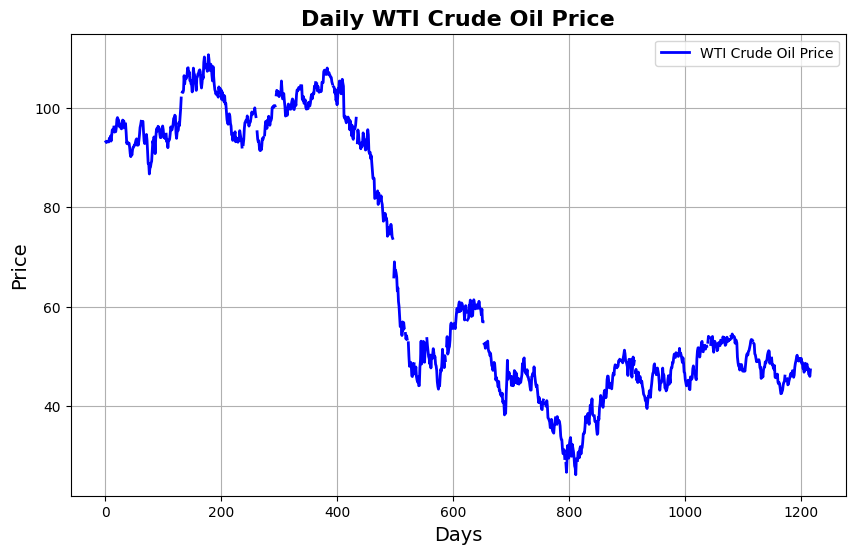

In [ ]:
# plot a line graph of the oil price
plt.figure(figsize=(10, 6))
plt.plot(oil['dcoilwtico'], color='blue', linestyle='-', linewidth=2, label='WTI Crude Oil Price')
plt.title('Daily WTI Crude Oil Price', fontsize=16, fontweight='bold')
plt.xlabel('Days', fontsize=14)
plt.ylabel('Price', fontsize=14)
plt.legend(loc='best')
plt.grid(True)
plt.show()

In [ ]:
# Forward fill the missing values in oil data on holidays
oil.loc[oil['date'].isin(holidays['date']), 'dcoilwtico'] = oil.loc[oil['date'].isin(holidays['date']), 'dcoilwtico'].ffill()

In [ ]:
# list the records for missing values in oil data
oil[oil['dcoilwtico'].isnull()]

,date,dcoilwtico
0,2013-01-01,NaN
14,2013-01-21,NaN
34,2013-02-18,NaN
63,2013-03-29,NaN
104,2013-05-27,NaN
132,2013-07-04,NaN
174,2013-09-02,NaN
237,2013-11-28,NaN
274,2014-01-20,NaN
294,2014-02-17,NaN


In [ ]:
# interpolate missing values in oil price
oil['dcoilwtico'] = oil['dcoilwtico'].interpolate()

In [ ]:
# backward fill the remaining missing values in oil data
oil['dcoilwtico'] = oil['dcoilwtico'].bfill()

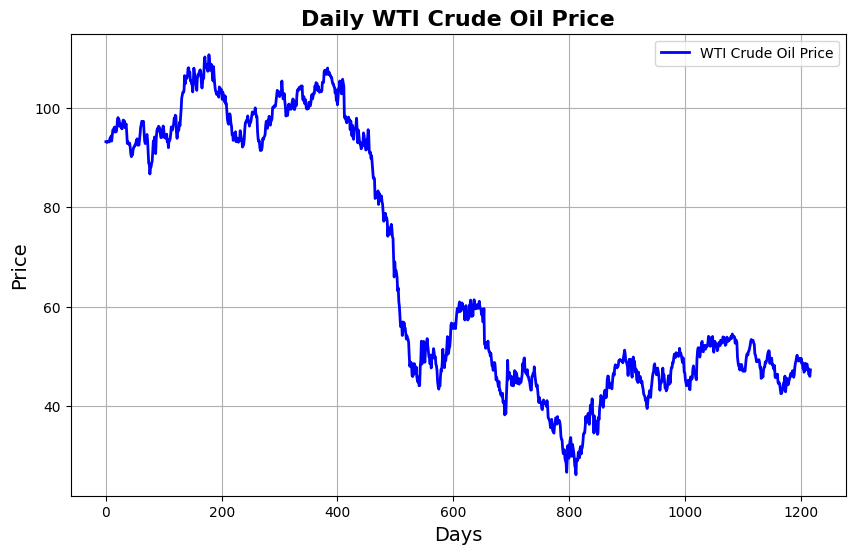

In [ ]:
# plot a line graph of the oil price
plt.figure(figsize=(10, 6))
plt.plot(oil['dcoilwtico'], color='blue', linestyle='-', linewidth=2, label='WTI Crude Oil Price')
plt.title('Daily WTI Crude Oil Price', fontsize=16, fontweight='bold')
plt.xlabel('Days', fontsize=14)
plt.ylabel('Price', fontsize=14)
plt.legend(loc='best')
plt.grid(True)
plt.show()

In [ ]:
# list the records for missing values in oil data
oil[oil['dcoilwtico'].isnull()]

,date,dcoilwtico


There are missing values in oil data for weekends

In [ ]:
missing_oil_dates = pd.date_range(train_start, test_end).difference(oil.date)
num_missing_oil_dates = len(missing_oil_dates)
num_wknd_missing = (missing_oil_dates.weekday >= 5).sum()
total_num_wknd = (pd.date_range(train_start, test_end).weekday >= 5).sum()

In [ ]:
cprint(
    "Missing oil dates",
    f"Number of missing oil dates: {num_missing_oil_dates}",
    f"Number of weekends missing : {num_wknd_missing}",
    f"Total number of weekends   : {total_num_wknd}",
)

Missing oil dates
Number of missing oil dates: 486
Number of weekends missing : 486
Total number of weekends   : 486


In [ ]:
# reindex oil data
oil = oil.merge(
    pd.DataFrame({"date": pd.date_range(train_start, test_end)}),
    on="date",
    how="outer",
).sort_values("date", ignore_index=True)

# fill missing values using linear interpolation
oil = oil.interpolate(method="linear", limit_direction="both")

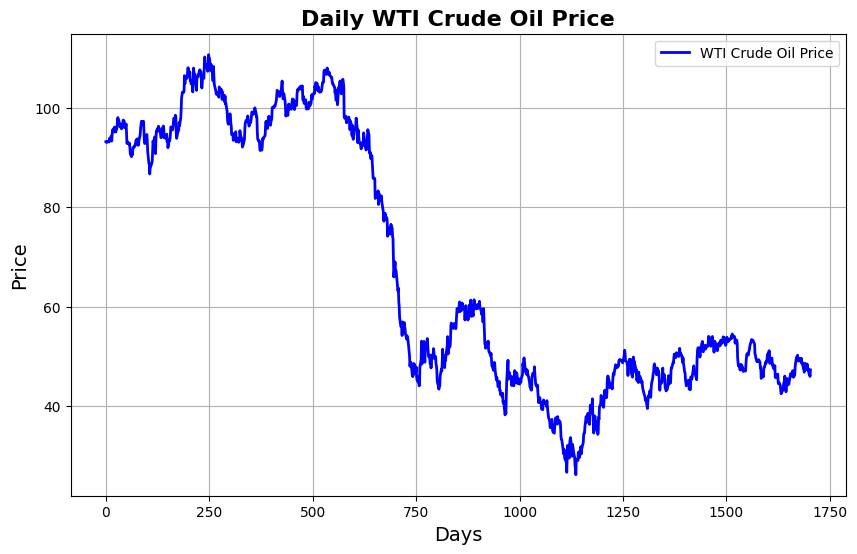

In [ ]:
# plot a line graph of the oil price
plt.figure(figsize=(10, 6))
plt.plot(oil['dcoilwtico'], color='blue', linestyle='-', linewidth=2, label='WTI Crude Oil Price')
plt.title('Daily WTI Crude Oil Price', fontsize=16, fontweight='bold')
plt.xlabel('Days', fontsize=14)
plt.ylabel('Price', fontsize=14)
plt.legend(loc='best')
plt.grid(True)
plt.show()

#### Transactions

We expect 91,152 records from 54 stores over 1,688 days, but there are less. Days with no sales aren’t included, so we’ll add zeros for those days.

After adding zeros, there are still missing records. These are not from days with no sales, so we’ll use linear interpolation to fill in these gaps.

In [ ]:
num_zero_sales = (train.groupby(["date", "store_nbr"]).sales.sum().eq(0)).sum()
total_rec = num_store * train_len 
curr_rec = len(transactions.index)
missing_rec = total_rec - curr_rec - num_zero_sales

In [ ]:
cprint(
    "Missing transaction records",
    f"Correct number of records: {total_rec}",
    "",
    "Breakdown...",
    f"Current number of records: {curr_rec}",
    f"Number of zero sales     : {num_zero_sales}",
    f"Number of missing records: {missing_rec}",
)

Missing transaction records
Correct number of records: 91152

Breakdown...
Current number of records: 83488
Number of zero sales     : 7546
Number of missing records: 118


In [ ]:
# compute total sales for each store
store_sales = train.groupby(["date", "store_nbr"]).sales.sum().reset_index()

# reindex transaction data
transactions = transactions.merge(
    store_sales,
    on=["date", "store_nbr"],
    how="outer",
).sort_values(["date", "store_nbr"], ignore_index=True)

# fill missing values with 0s for days with zero sales
transactions.loc[transactions.sales.eq(0), "transactions"] = 0.
transactions = transactions.drop(columns=["sales"])

# fill remaining missing values using linear interpolation
transactions.transactions = transactions.groupby("store_nbr", group_keys=False).transactions.apply(
    lambda x: x.interpolate(method="linear", limit_direction="both")
)

In [ ]:
transactions.head()

,date,store_nbr,transactions,year,month,dayofweek
0,2013-01-01,1,0.00,NaN,NaN,NaN
1,2013-01-01,2,0.00,NaN,NaN,NaN
2,2013-01-01,3,0.00,NaN,NaN,NaN
3,2013-01-01,4,0.00,NaN,NaN,NaN
4,2013-01-01,5,0.00,NaN,NaN,NaN


### Outliers

#### Oil

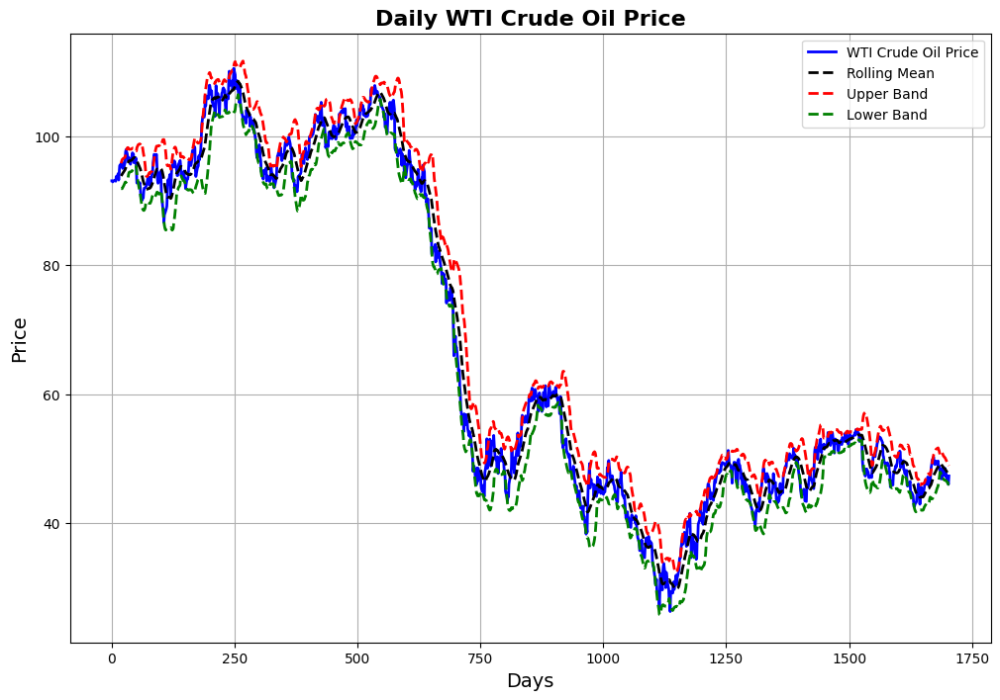

In [ ]:
# outlier detection using bollinger bands
oil['rolling_mean'] = oil['dcoilwtico'].rolling(window=20).mean()
oil['rolling_std'] = oil['dcoilwtico'].rolling(window=20).std()
oil['upper_band'] = oil['rolling_mean'] + (oil['rolling_std'] * 2)
oil['lower_band'] = oil['rolling_mean'] - (oil['rolling_std'] * 2)

plt.figure(figsize=(12, 8))
plt.plot(oil['dcoilwtico'], color='blue', linestyle='-', linewidth=2, label='WTI Crude Oil Price')
plt.plot(oil['rolling_mean'], color='black', linestyle='--', linewidth=2, label='Rolling Mean')
plt.plot(oil['upper_band'], color='red', linestyle='--', linewidth=2, label='Upper Band')
plt.plot(oil['lower_band'], color='green', linestyle='--', linewidth=2, label='Lower Band')
plt.title('Daily WTI Crude Oil Price', fontsize=16, fontweight='bold')
plt.xlabel('Days', fontsize=14)
plt.ylabel('Price', fontsize=14)
plt.legend(loc='best')
plt.grid(True)
plt.show()

#### Merging oil data with train dataset

In [ ]:
train = pd.merge(train, oil[['date', 'dcoilwtico']], on='date', how='left')
train.head()

,date,store_nbr,family,id,sales,onpromotion,dcoilwtico
0,2013-01-01,1,10,0.00,0.00,0.00,93.14
1,2013-01-01,1,2,1.00,0.00,0.00,93.14
2,2013-01-01,1,7,2.00,0.00,0.00,93.14
3,2013-01-01,1,32,3.00,0.00,0.00,93.14
4,2013-01-01,1,1,4.00,0.00,0.00,93.14


## Further Analysis

### Analysis between different features

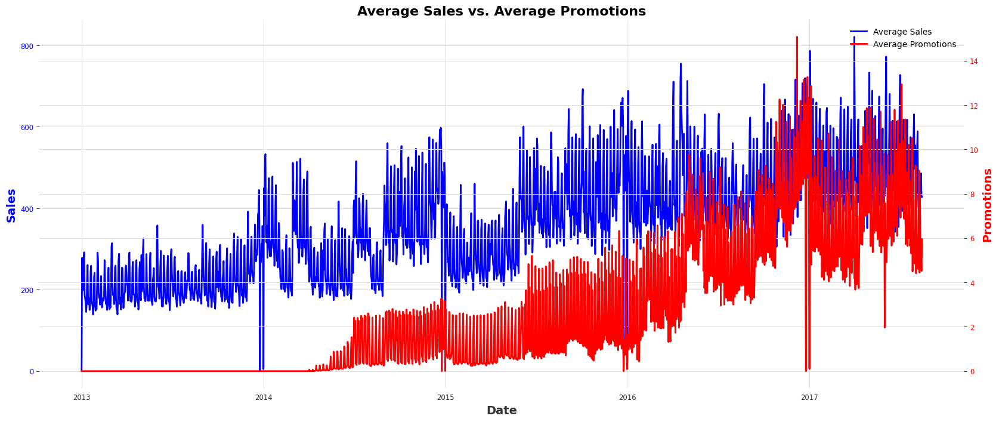

In [ ]:
# Plot Average Sales vs. Average Promotions
plt.figure(figsize=(20, 8))
ax1 = plt.gca()  # Get current axis for sales
ax2 = ax1.twinx()  # Create another axis for promotions

# Plotting average sales
ax1.plot(train.groupby('date').sales.mean(), color='blue', linestyle='-', linewidth=2, label='Average Sales')
ax1.set_xlabel('Date', fontsize=14)
ax1.set_ylabel('Sales', fontsize=14, color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Plotting average promotions on the new axis
ax2.plot(train.groupby('date').onpromotion.mean(), color='red', linestyle='-', linewidth=2, label='Average Promotions')
ax2.set_ylabel('Promotions', fontsize=14, color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Title and grid
plt.title('Average Sales vs. Average Promotions', fontsize=16, fontweight='bold')
plt.grid(True)

# Creating legends for both axes
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='best')

plt.show()

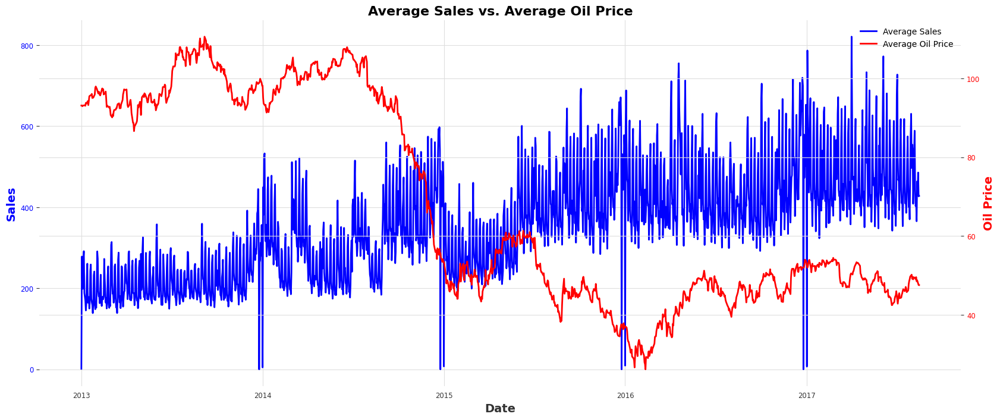

In [ ]:
# Plot Average Sales vs Oil Price
plt.figure(figsize=(20, 8))
ax1 = plt.gca()  # Get current axis for sales
ax2 = ax1.twinx()  # Create another axis for oil price

# Plotting average sales
ax1.plot(train.groupby('date').sales.mean(), color='blue', linestyle='-', linewidth=2, label='Average Sales')
ax1.set_xlabel('Date', fontsize=14)
ax1.set_ylabel('Sales', fontsize=14, color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Plotting average oil price on the new axis
ax2.plot(train.groupby('date').dcoilwtico.mean(), color='red', linestyle='-', linewidth=2, label='Average Oil Price')
ax2.set_ylabel('Oil Price', fontsize=14, color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Title and grid
plt.title('Average Sales vs. Average Oil Price', fontsize=16, fontweight='bold')
plt.grid(True)

# Creating legends for both axes
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='best')

plt.show()

### ACF and PACF

In [ ]:
train['family'].unique()

NameError: name 'train' is not defined

In [ ]:
# ACF and PACF for each family
for family in train['family'].unique():
    family_data = train[train['family'] == family]['sales']
    fig, ax = plt.subplots(figsize=(10, 6))
    sm.graphics.tsa.plot_acf(family_data, lags=30, ax=ax)
    ax.set_title(f"ACF for {family}")
    plt.show()

    fig, ax = plt.subplots(figsize=(10, 6))
    sm.graphics.tsa.plot_pacf(family_data, lags=30, ax=ax)
    ax.set_title(f"PACF for {family}")
    plt.show()

NameError: name 'train' is not defined

## Model Development

### Data Preparation